In [1]:
# import libraries
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
plt.style.use('dark_background')
plt.style.use('ggplot')
from matplotlib.pyplot import figure
from matplotlib.ticker import FuncFormatter


%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) # adjusts the configuration of the plots that will create


In [89]:
#connect google drive
from google.colab import drive
drive.mount ('/content/drive')

#import data movies.csv
df = pd.read_csv ('/content/drive/My Drive/Data analysis/movies.csv', sep=',')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [90]:
#show the data
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [91]:
# let's see if there is any missing data

for col in df.columns:
  print(df[col].isnull().value_counts(), "\n") # true = show count of missing values

False    7668
Name: name, dtype: int64 

False    7591
True       77
Name: rating, dtype: int64 

False    7668
Name: genre, dtype: int64 

False    7668
Name: year, dtype: int64 

False    7666
True        2
Name: released, dtype: int64 

False    7665
True        3
Name: score, dtype: int64 

False    7665
True        3
Name: votes, dtype: int64 

False    7668
Name: director, dtype: int64 

False    7665
True        3
Name: writer, dtype: int64 

False    7667
True        1
Name: star, dtype: int64 

False    7665
True        3
Name: country, dtype: int64 

False    5497
True     2171
Name: budget, dtype: int64 

False    7479
True      189
Name: gross, dtype: int64 

False    7651
True       17
Name: company, dtype: int64 

False    7664
True        4
Name: runtime, dtype: int64 



In [92]:
#  drop any rows with null values

df = df.dropna(how='any',axis=0) 

In [93]:
# see datatype

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [94]:
# change data type of columns

df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')
df['votes'] = df['votes'].astype('int64')


In [95]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.4,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.9,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.2,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.8,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.0,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0


karena year sama release date tidak cocok, maka year diambil dari release date

In [96]:
# create correct year column

df['yearcorrect'] = df['released'].astype(str).str.split(', ').str[-1].astype(str).str[:4]

In [97]:
df['year'].unique()

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [98]:
pd.set_option('display.max_rows', None)

In [105]:
df = df.sort_values(by=['gross'], inplace=False, ascending=False)

In [107]:
# drop any duplicates

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
7480,The Lion King,PG,Animation,2019,"July 19, 2019 (United States)",6.9,222000,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,2019
6653,Jurassic World,PG-13,Action,2015,"June 12, 2015 (United States)",7.0,593000,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,2015
6043,The Avengers,PG-13,Action,2012,"May 4, 2012 (United States)",8.0,1300000,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,2012
6646,Furious 7,PG-13,Action,2015,"April 3, 2015 (United States)",7.1,370000,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,2015
7494,Frozen II,PG,Animation,2019,"November 22, 2019 (United States)",6.8,148000,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,2019


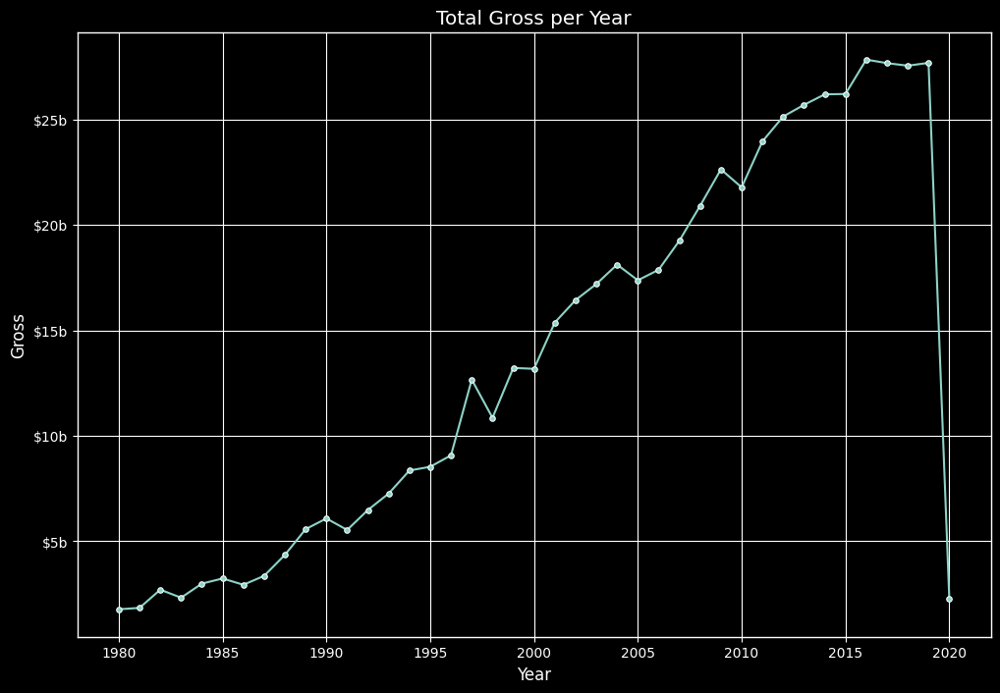

In [69]:
yearly_gross = df.groupby('year')['gross'].sum() / 1_000_000_000

plt.style.use('dark_background')
sns.lineplot(x=yearly_gross.index, y=yearly_gross.values, marker='o',markersize='4')

# format the y-axis labels as billion dollars with no decimal places and a 'b' suffix
def billions(x, pos):
    return f'${x:.0f}b'
formatter = FuncFormatter(billions)
plt.gca().yaxis.set_major_formatter(formatter)


# Set the chart title and axis labels
plt.title("Total Gross per Year")
plt.xlabel("Year")
plt.ylabel("Gross")


# Show the chart
plt.show()

<Axes: >

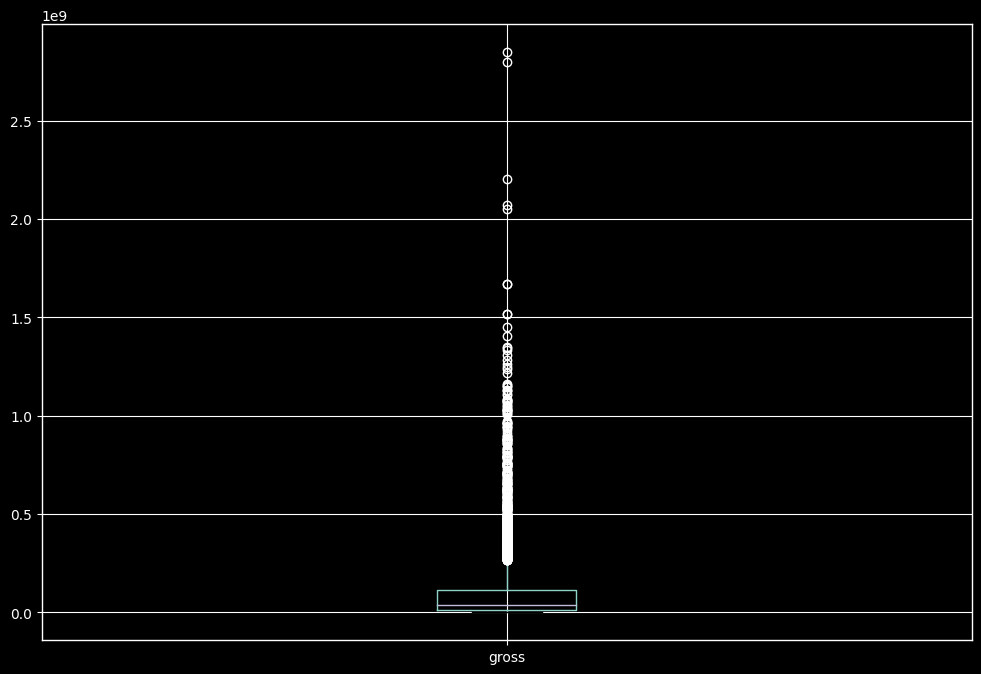

In [ ]:
# Are there any Outliers?

df.boxplot(column=['gross'])

is big budget create big gross?


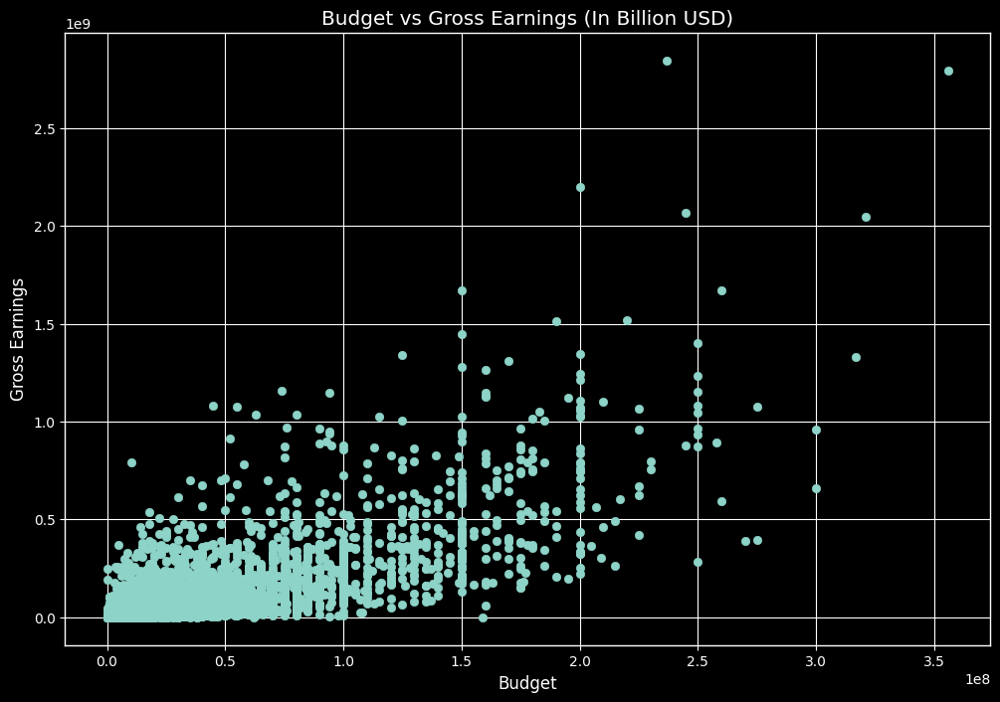

In [ ]:
# scatter plot with budget vs gross

plt.scatter(x=df['budget'], y=df['gross'])
plt.title('Budget vs Gross Earnings (In Billion USD)')

plt.xlabel('Budget')
plt.ylabel('Gross Earnings')

plt.show()

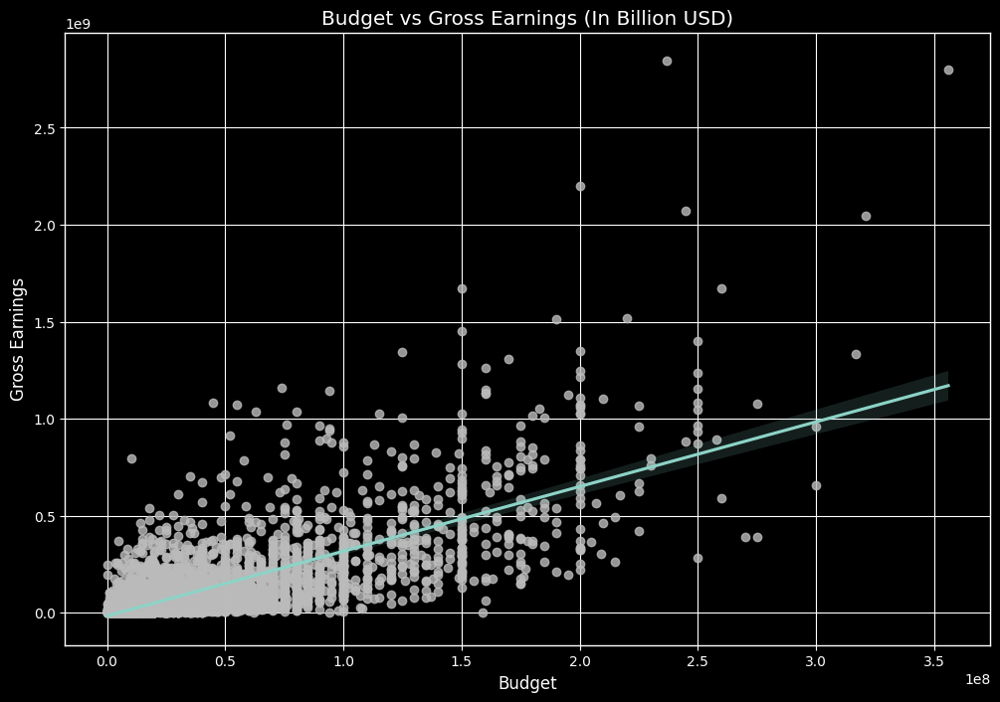

In [ ]:
# plot budget vs gross using seaborn

plt.style.use('dark_background')
sns.regplot(x='budget', y='gross', data=df,scatter_kws={"color": "#bbbbbbff"})

plt.title('Budget vs Gross Earnings (In Billion USD)')
plt.xlabel('Budget')
plt.ylabel('Gross Earnings')

plt.show()

is big score also equal to big revenue?

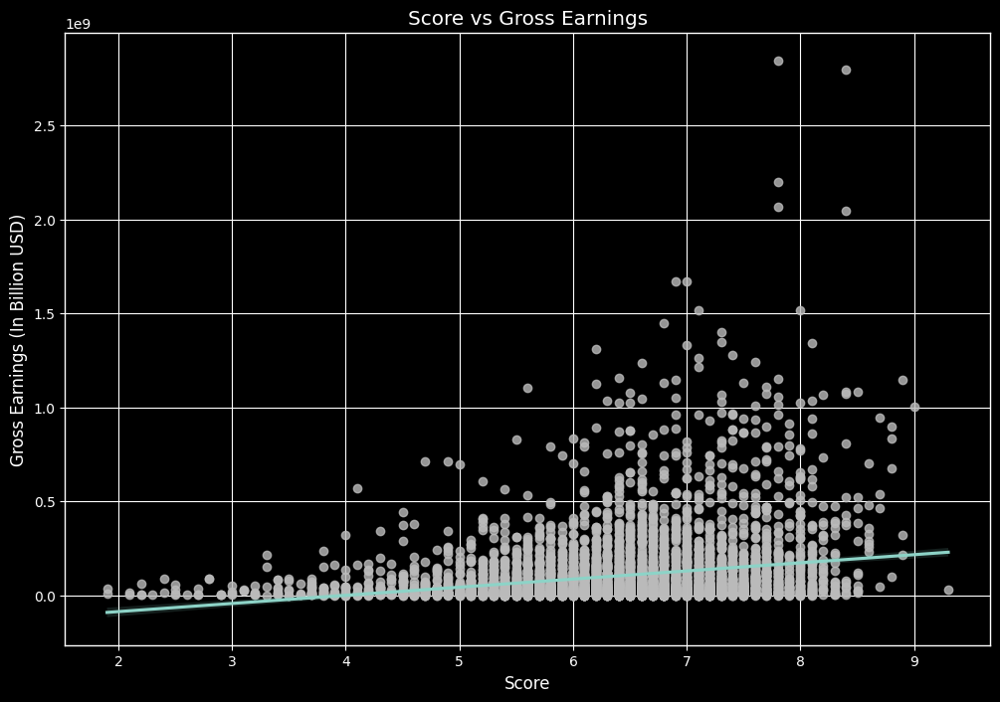

In [ ]:
# plot score vs gross using seaborn
plt.style.use('dark_background')

sns.regplot(x='score', y='gross', data=df, scatter_kws={"color": "#bbbbbbff"})
plt.title('Score vs Gross Earnings')

plt.xlabel('Score')
plt.ylabel('Gross Earnings (In Billion USD)')

plt.show()

In [ ]:
# see corelation

df.corr() #using default method(pearson)

,year,score,votes,budget,gross,runtime
year,1.000000,0.056386,0.206021,0.327722,0.274321,0.075077
score,0.056386,1.000000,0.474256,0.072001,0.222556,0.414068
votes,0.206021,0.474256,1.000000,0.439675,0.614751,0.352303
budget,0.327722,0.072001,0.439675,1.000000,0.740247,0.318695
gross,0.274321,0.222556,0.614751,0.740247,1.000000,0.275796
runtime,0.075077,0.414068,0.352303,0.318695,0.275796,1.000000


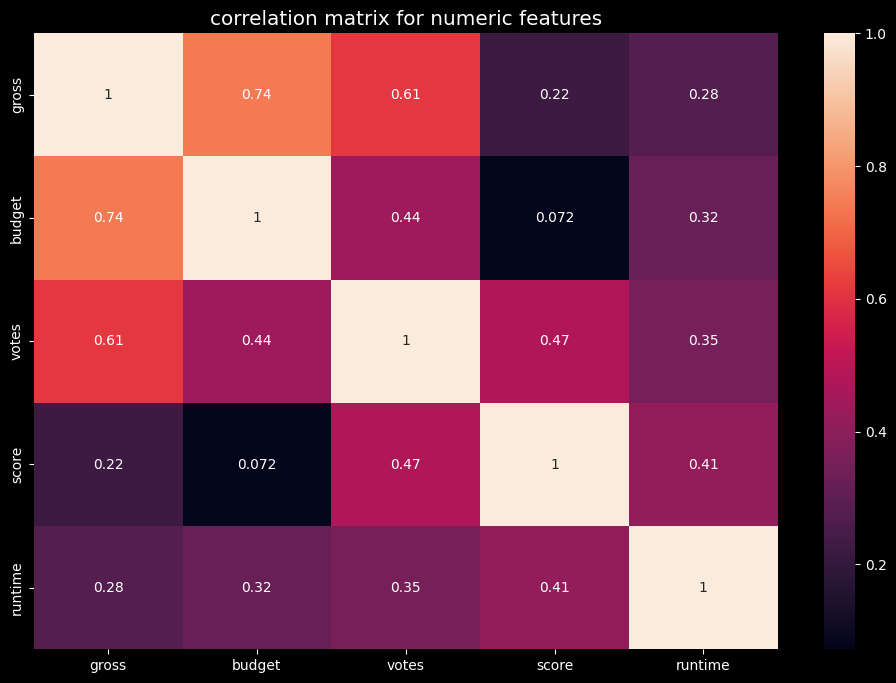

In [110]:
# create correlation matrix

# Select columns for correlation matrix
cols = ['gross', 'budget', 'votes', 'score', 'runtime']

# Compute correlation matrix
corr = df[cols].corr()

# Plot correlation matrix using heatmap
sns.heatmap(corr, annot=True)

plt.title('correlation matrix for numeric features')

plt.show()

so, High correlation betwwen budget and gross .....

/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:3544: UserWarning: 83.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:3544: UserWarning: 77.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:3544: UserWarning: 22.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:3544: UserWarning: 93.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:3544: UserWarning: 63.6% of the points cannot be placed; y

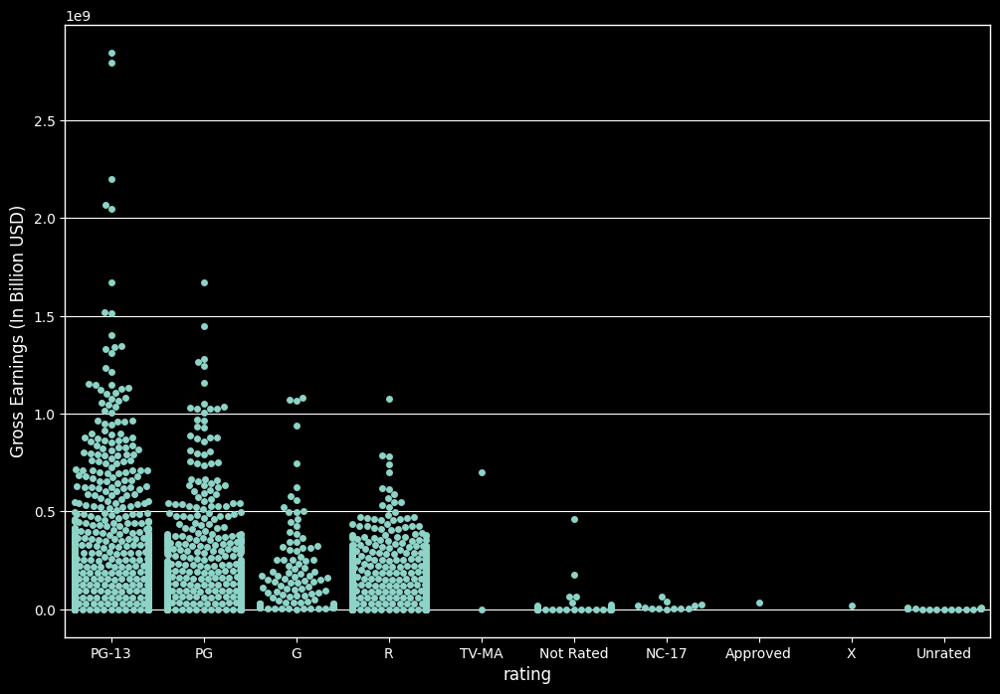

In [ ]:
#rating .. gross

sns.swarmplot(x="rating", y="gross", data=df)

plt.xlabel('rating')
plt.ylabel('Gross Earnings (In Billion USD)')

plt.show()

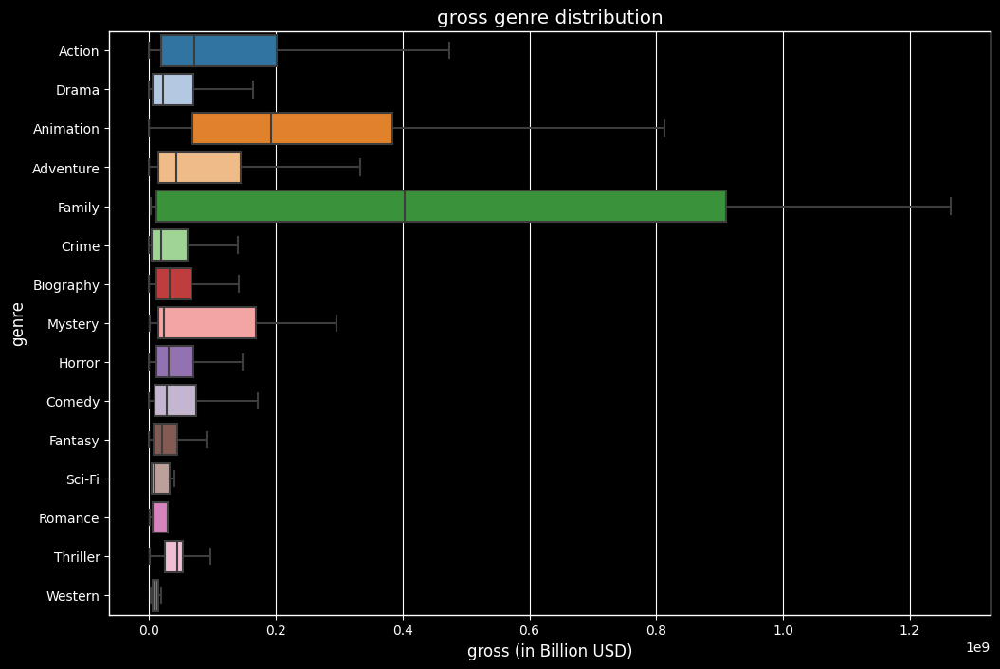

In [ ]:
# gross genre distribution

genre_gross = df.groupby('genre')['gross'].sum().sort_values(ascending=False)

sns.boxplot(x='gross', y='genre', data=df, palette='tab20',  showfliers=False)

plt.title('gross genre distribution')
plt.xlabel('gross (in Billion USD)')

plt.show()

<ipython-input-31-6f1374c1b8d2>:6: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x=gross_amount, y=df['genre'], palette='tab20', estimator=sum, ci=None,


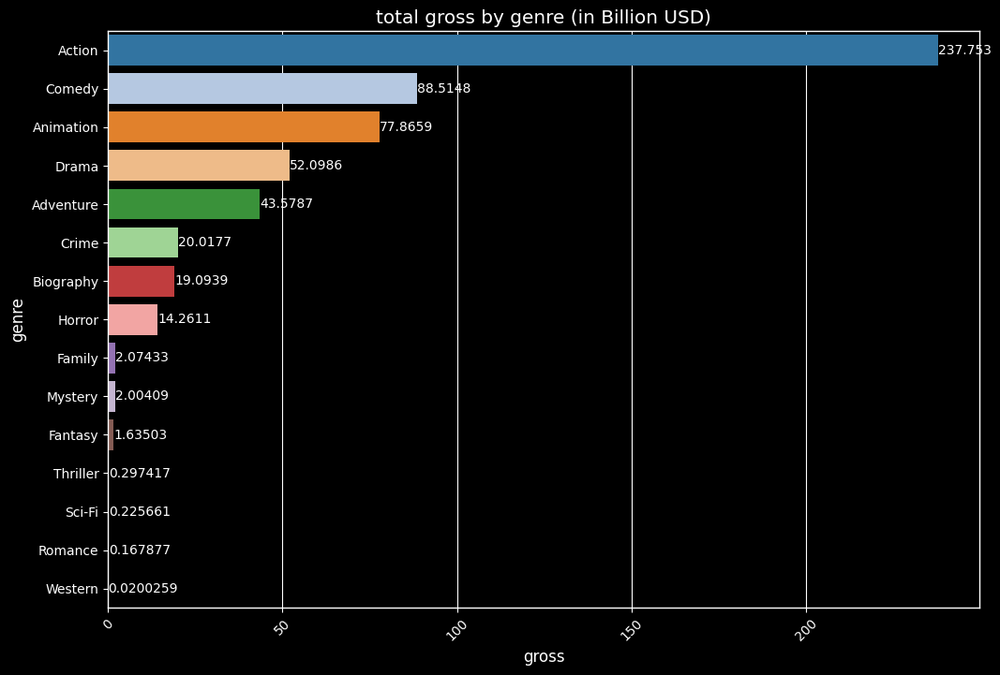

In [ ]:
#bar diagram
gross_amount = df['gross'] / 1_000_000_000

plt.style.use('dark_background')

ax = sns.barplot(x=gross_amount, y=df['genre'], palette='tab20', estimator=sum, ci=None, 
                 order=df.groupby(['genre']).sum()['gross'].sort_values(ascending=False).index)

ax.set(title='total gross by genre (in Billion USD)',xlabel="gross", ylabel='genre')
#show label
ax.bar_label(ax.containers[0], rotation=0)

#rotate x
for item in ax.get_xticklabels():
    item.set_rotation(45)


top 5 movies that got highest revenue

<ipython-input-32-1b3be8568f91>:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(x='name', y=gross_amount, palette = 'tab20',data=df.head(), ci=None )


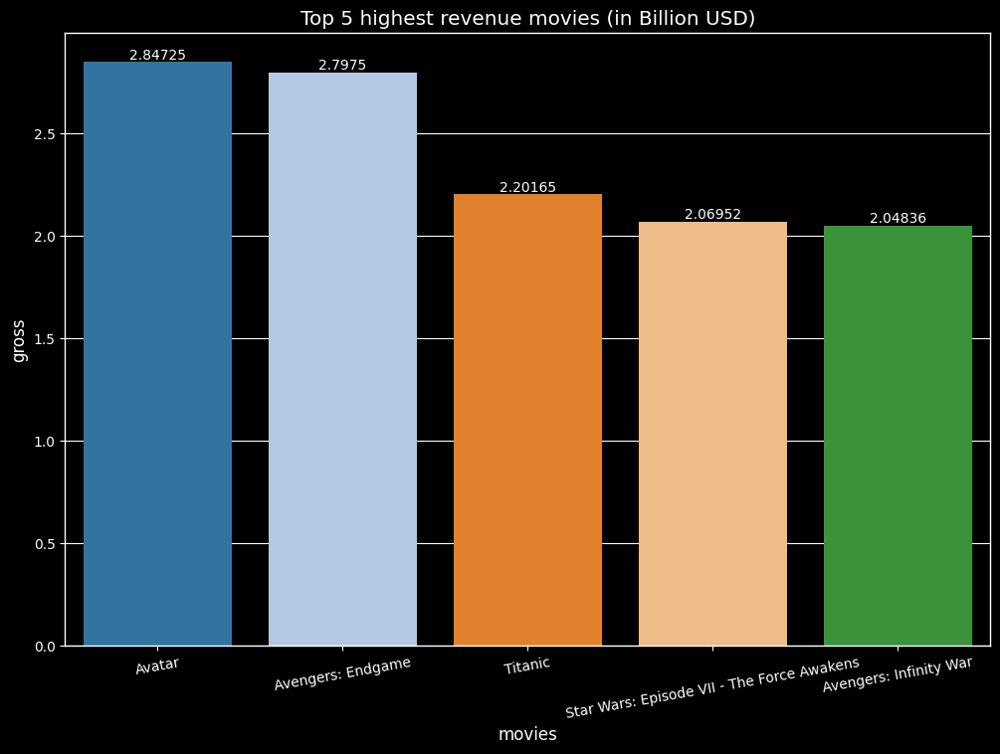

In [ ]:

gross_amount = df['gross'] / 1_000_000_000

plt.style.use('dark_background')

ax = sns.barplot(x='name', y=gross_amount, palette = 'tab20',data=df.head(), ci=None )

#title
ax.set(title='Top 5 highest revenue movies (in Billion USD)',xlabel="movies", ylabel='gross')
#show label
ax.bar_label(ax.containers[0], rotation=0)

#rotate x
for item in ax.get_xticklabels():
    item.set_rotation(10)


plt.show()

In [88]:
# Filter the dataframe to include only movies from 2020
movies_2020 = df[df['year'] == 2020]

# Print the resulting dataframe
print(movies_2020)

Empty DataFrame
Columns: [name, rating, genre, year, released, score, votes, director, writer, star, country, budget, gross, company, runtime]
Index: []


In [101]:

# filter the dataframe to include only the rows from 2015 to 2019
df_15to19 = df[(df['year'] >= 2015) & (df['year'] <= 2019)]

# calculate the total gross using the sum() function
total_gross = df_15to19['gross'].sum()

# print the total gross
print("The total gross from 2015 to 2019 is:", total_gross)


The total gross from 2015 to 2019 is: 136995466582


In [102]:

# Filter the data for year 2016
df_2016 = df[df['year'] == 2016]

# Compute the total gross for year 2020
total_gross_2016 = df_2016['gross'].sum()

# Print the total gross for year 2020
print("Total gross in 2016: $",total_gross_2016)

# Filter the data for year 2020
df_2020 = df[df['year'] == 2020]

# Compute the total gross for year 2020
total_gross_2020 = df_2020['gross'].sum()

# Print the total gross for year 2020
print("Total gross in 2020: $",total_gross_2020)

Total gross in 2016: $ 27847564254
Total gross in 2020: $ 2272901821


In [103]:
# filter movies in 2019 and 2020
movies_2019 = df[df['year'] == 2019]
movies_2020 = df[df['year'] == 2020]

# calculate gross for 2019 and 2020
gross_2019 = movies_2019['gross'].sum()
gross_2020 = movies_2020['gross'].sum()

# calculate percentage reduction
percentage_reduction = ((gross_2019 - gross_2020) / gross_2019) * 100
print("percentage_reduction in 2019 to 2019: $",percentage_reduction)

percentage_reduction in 2019 to 2019: $ 91.79240495281525
